In [1]:
import folium
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split


In [2]:
# Importing Dataset into a DataFrame
df_crime = pd.read_csv('crime.csv')

# Cleaning & Transforming the data
df_crime['HOUR'].fillna(00, inplace = True) # 把HOUR的空值填充为00
df_crime['NEIGHBOURHOOD'].fillna('N/A', inplace = True) # 把NEIGHBOURHOOD的空值填充为N/A
df_crime['HUNDRED_BLOCK'].fillna('N/A', inplace = True) # 把HUNDRED_BLOCK的空值填充为N/A
df_crime.drop(columns=['MINUTE'], inplace=True) # 删除MINUTE列，因为不重要
df_crime['NeighbourhoodID'] = df_crime.groupby('NEIGHBOURHOOD').ngroup().add(1) # 创建NeighbourhoodID列，代表社区
df_crime['CrimeTypeID'] = df_crime.groupby('TYPE').ngroup().add(1) # 创建CrimeTypeID列，代表犯罪类型
df_crime['Incident'] = 1 # 创建Incident列，表示犯罪事件
df_crime['Date'] = pd.to_datetime({'year':df_crime['YEAR'], 'month':df_crime['MONTH'], 'day':df_crime['DAY']}) # 创建Date列，表示日期
df_crime['DayOfWeek'] = df_crime['Date'].dt.day_name() # 创建DayOfWeek列，表示星期几
df_crime['DayOfWeekID'] = df_crime['Date'].dt.weekday # 创建DayOfWeekID列，表示星期几的，例如0代表周一，1代表周二

#这里是创建一个2017单独的数据
df_pred = df_crime[(df_crime['YEAR'] >= 2017)]

# 把2017排出在外是因为其他的都是完整年份
df_crime = df_crime[(df_crime['YEAR'] < 2017)]

# Calling a dataframe results
df_crime.head()

C:\Users\Xuqiao Jiang\AppData\Local\Temp\ipykernel_24164\3517595892.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_crime['HOUR'].fillna(00, inplace = True) # 把HOUR的空值填充为00
C:\Users\Xuqiao Jiang\AppData\Local\Temp\ipykernel_24164\3517595892.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always be

,TYPE,YEAR,MONTH,DAY,HOUR,HUNDRED_BLOCK,NEIGHBOURHOOD,X,Y,Latitude,Longitude,NeighbourhoodID,CrimeTypeID,Incident,Date,DayOfWeek,DayOfWeekID
0,Other Theft,2003,5,12,16.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,21,6,1,2003-05-12,Monday,0
1,Other Theft,2003,5,7,15.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,21,6,1,2003-05-07,Wednesday,2
2,Other Theft,2003,4,23,16.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,21,6,1,2003-04-23,Wednesday,2
3,Other Theft,2003,4,20,11.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,21,6,1,2003-04-20,Sunday,6
4,Other Theft,2003,4,12,17.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,21,6,1,2003-04-12,Saturday,5


In [3]:
print("Crime Type Distribution:")
print(df_crime['TYPE'].value_counts())

Crime Type Distribution:
TYPE
Theft from Vehicle                                        166738
Mischief                                                   67832
Break and Enter Residential/Other                          59558
Offence Against a Person                                   52537
Other Theft                                                49301
Theft of Vehicle                                           37663
Break and Enter Commercial                                 32734
Theft of Bicycle                                           24744
Vehicle Collision or Pedestrian Struck (with Injury)       21230
Vehicle Collision or Pedestrian Struck (with Fatality)       249
Homicide                                                     209
Name: count, dtype: int64


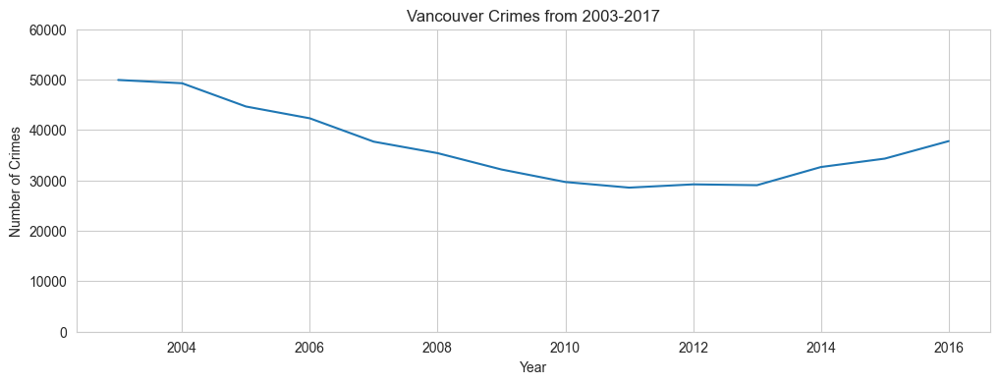

In [4]:
sns.set_style("whitegrid")

# Count all crimes and group by year
df_Crime_Year = pd.pivot_table(df_crime, values=["Incident"],index = ["YEAR"], aggfunc='count')

# Graph results of Year by Crimes
f, ax = plt.subplots(1,1, figsize = (12, 4), dpi=100)
X = df_Crime_Year.index
y = df_Crime_Year
ax.plot(X, y)
ax.set_ylim(ymin=0, ymax=60000)
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.title('Vancouver Crimes from 2003-2017')
plt.show()

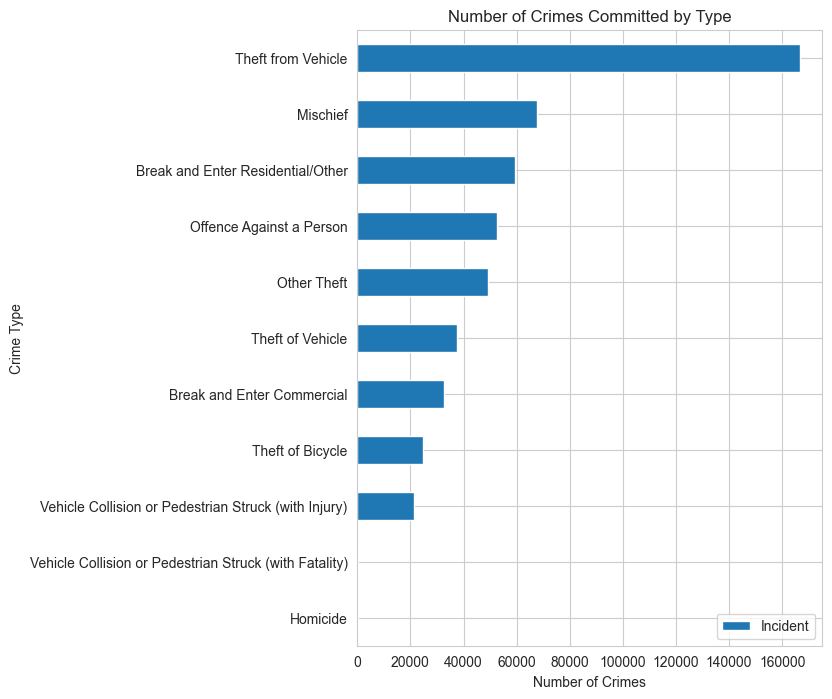

In [5]:
df_Crime_Type = pd.pivot_table(df_crime, values=["Incident"],index = ["TYPE"], aggfunc='count')

df_Crime_Type = df_Crime_Type.sort_values(['Incident'], ascending=True)

# Create bar graph for number of crimes by Type of Crime
crime_plot = df_Crime_Type.plot(kind='barh',
               figsize = (6,8),
               title='Number of Crimes Committed by Type'
             )

plt.rcParams["figure.dpi"] = 100
plt.legend(loc='lower right')
plt.ylabel('Crime Type')
plt.xlabel('Number of Crimes')
plt.show(crime_plot)


· Theft from Vehicle 在2003到2017年是最多的

· Homicide 在2003到2017年是最少的

下面的数据是看一周内哪天或者几天的犯罪量最多

结论是双休带上周五的犯罪量最多

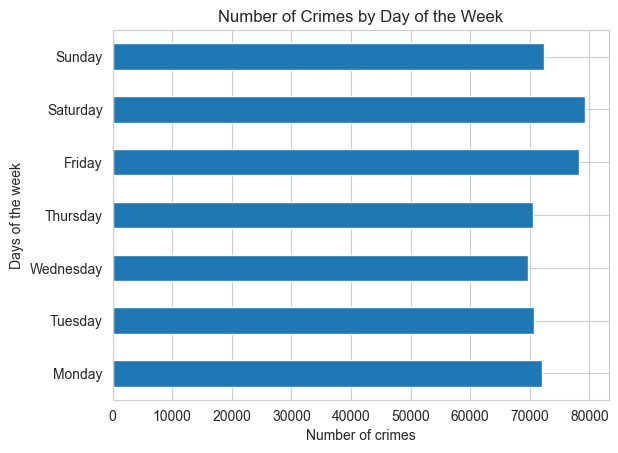

In [6]:

days = ['Monday','Tuesday','Wednesday',  'Thursday', 'Friday', 'Saturday', 'Sunday']

# Grouping dataframe by Day of Week ID and plotting
df_crime.groupby(df_crime["DayOfWeekID"]).size().plot(kind='barh')

# Customizing Plot 
plt.ylabel('Days of the week')
plt.yticks(np.arange(7), days)
plt.xlabel('Number of crimes')
plt.title('Number of Crimes by Day of the Week')
plt.show()

下面的数据是看每年的不同的犯罪类型的量

观察每行的数据

1. 可以看到2003-2017年，Theft from Vehicle 的犯罪量是最多的，Homicide 是最少的

2. 2003-2017年，Theft from Vehicle 的犯罪量是逐年递增的，Homicide 是逐年递减的

3. 2010到2013年应该是犯罪量最低的，尤其是Theft from Vehicle

4. 比较稳定的是Homicide, all vehicles collision, and mischief

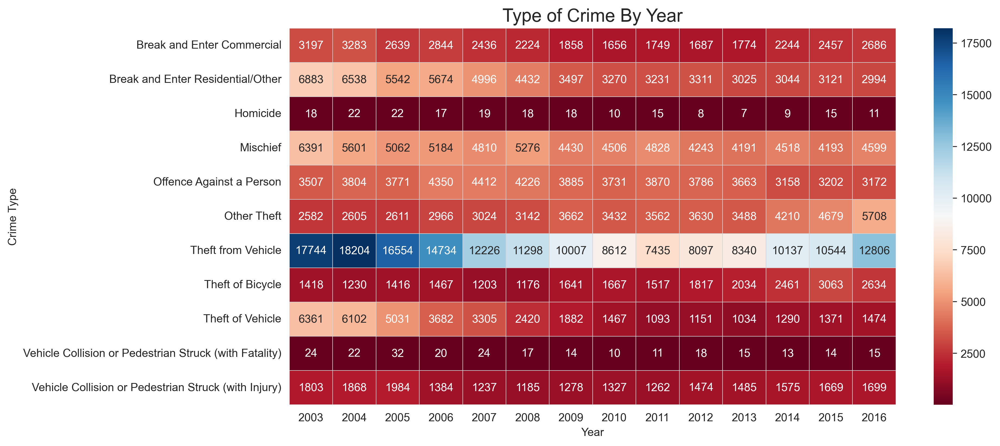

In [7]:
# 创建一个pivot table，把犯罪类型作为行，年份作为列，犯罪事件作为值
df_Piv_Year = df_crime.pivot_table(values='Incident', index='TYPE', columns='YEAR', aggfunc=len)

fig, ax = plt.subplots(1, 1, figsize = (12, 6), dpi=300)
plt.title('Type of Crime By Year', fontsize=16)
plt.tick_params(labelsize=10)

sns.heatmap(
    df_Piv_Year.round(), 
    linecolor='lightgrey', 
    linewidths=0.1,
    cmap='RdBu',
    annot=True, 
    fmt=".0f"
);

ax.set_ylabel('Crime Type')    
ax.set_xlabel('Year')

plt.show()


### 基于上面的结论，现在利用随机数分析犯罪模式

1. 使用随机森林模型来预测犯罪类型（用了年、月、日、时、犯罪类型、社区ID）预测犯罪发生的社区

2. 可以看出Central Business District的犯罪事件最多，尤其是Theft from Vehicle，当然其他的类型也是最多的

3. NeighbourhoodID是最重要的预测特征，接着是TYPE_encoded和HOUR。YEAR、DAY、MONTH的重要性相对较低（说明犯罪地点和类型是预测中最关键的因素）

4. 这样的数据可以帮助警察局更好的分配警力，以及预测犯罪高发区域，从而更好的预防犯罪

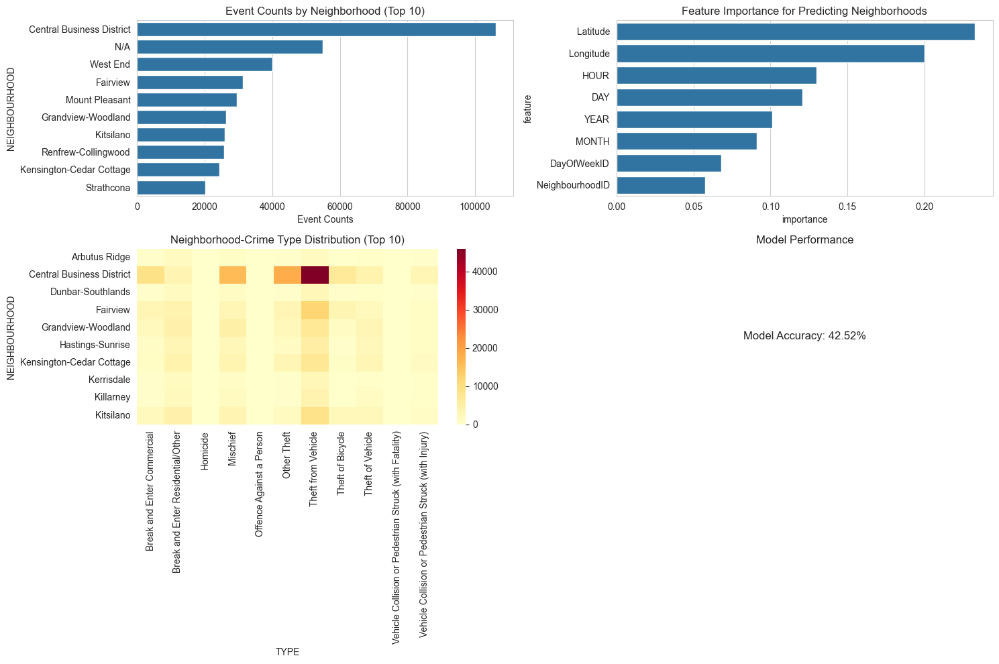

In [8]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

df_rf = df_crime.copy()

df_rf = df_rf.dropna(subset=['NEIGHBOURHOOD'])

# User LabelEncoder to encode the categorical variables
le_neighborhood = LabelEncoder()
le_type = LabelEncoder()

# Encode the categorical variables
df_rf.loc[:, 'NEIGHBOURHOOD_encoded'] = le_neighborhood.fit_transform(df_rf['NEIGHBOURHOOD'])
df_rf.loc[:, 'TYPE_encoded'] = le_type.fit_transform(df_rf['TYPE'])

features = ['YEAR', 'MONTH', 'DAY', 'HOUR', 'NeighbourhoodID', 'Latitude', 'Longitude','DayOfWeekID']
X = df_rf[features]
y = df_rf['TYPE_encoded']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Random Forest model
rf_model = RandomForestClassifier(
    n_estimators=500,
    max_depth=20,
    min_samples_split=30,
    min_samples_leaf=15,
    max_features='sqrt',
    class_weight='balanced',
    random_state=42,
    max_samples=0.6
)
rf_model.fit(X_train, y_train)

# Predict and evaluate
y_pred = rf_model.predict(X_test)

# Analyze feature importance
feature_importance = pd.DataFrame({
    'feature': features,
    'importance': rf_model.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

# Visualize
plt.figure(figsize=(15, 10))

# 1. Event Counts by Neighborhood (Top 10)
plt.subplot(2, 2, 1)
neighborhood_counts = df_rf['NEIGHBOURHOOD'].value_counts()
sns.barplot(x=neighborhood_counts.values[:10], y=neighborhood_counts.index[:10])
plt.title('Event Counts by Neighborhood (Top 10)')
plt.xlabel('Event Counts')

# 2. Feature Importance for Predicting Neighborhoods    
plt.subplot(2, 2, 2)
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('Feature Importance for Predicting Neighborhoods')

# 3. Neighborhood-Crime Type Distribution (Top 10)
plt.subplot(2, 2, 3)
neighborhood_type_pivot = pd.crosstab(df_rf['NEIGHBOURHOOD'], df_rf['TYPE'])
sns.heatmap(neighborhood_type_pivot.head(10), cmap='YlOrRd')
plt.title('Neighborhood-Crime Type Distribution (Top 10)')

# 4. Model Accuracy
plt.subplot(2, 2, 4)
accuracy = rf_model.score(X_test, y_test)
plt.text(0.5, 0.5, f'Model Accuracy: {accuracy:.2%}', 
         horizontalalignment='center', verticalalignment='center', fontsize=12)
plt.axis('off')
plt.title('Model Performance')

plt.tight_layout()
plt.show()


In [28]:
from sklearn.dummy import DummyClassifier

df_dummy = df_rf.copy()

features = ['YEAR', 'MONTH', 'DAY', 'HOUR', 'NeighbourhoodID', 'Latitude', 'Longitude','DayOfWeekID']
X = df_rf[features]
y = df_rf['TYPE_encoded']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

dummy_classfier_freq = DummyClassifier(strategy='most_frequent')
dummy_classfier_freq.fit(X_train, y_train)

score_dummy_freq = dummy_classfier_freq.score(X_test, y_test)

score_dummy_freq

0.3245643970787547

In [26]:
df_rf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 512795 entries, 0 to 512794
Data columns (total 20 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   TYPE                   512795 non-null  object        
 1   YEAR                   512795 non-null  int64         
 2   MONTH                  512795 non-null  int64         
 3   DAY                    512795 non-null  int64         
 4   HOUR                   512795 non-null  float64       
 5   HUNDRED_BLOCK          512795 non-null  object        
 6   NEIGHBOURHOOD          512795 non-null  object        
 7   X                      512795 non-null  float64       
 8   Y                      512795 non-null  float64       
 9   Latitude               512795 non-null  float64       
 10  Longitude              512795 non-null  float64       
 11  NeighbourhoodID        512795 non-null  int64         
 12  CrimeTypeID            512795 non-null  int64    

In [9]:
import geopandas as gpd
from folium.plugins import MarkerCluster
import ipywidgets as widgets
from IPython.display import display

gdf_crime = gpd.GeoDataFrame(df_crime, geometry=gpd.points_from_xy(df_crime.Longitude, df_crime.Latitude))
gdf_crime.crs = "EPSG:4326"

# Create basic Folium crime map
crime_map = folium.Map(location=[49.26, -123.1207], zoom_start=12., tiles='cartodbpositron', attr='CartoDB')

# Function to update the data points based on the selected year
def update_data_points(year):
    # Clear existing marker cluster layer
    crime_map.get_root().html.add_child(folium.Element("<script>document.getElementById('marker_cluster').remove();</script>"))

    # Filter data for the selected year
    data_points = gdf_crime[gdf_crime.YEAR == year]
    data_points = data_points[['Latitude', 'Longitude']]
    data_points = data_points.dropna(axis=0, subset=['Latitude', 'Longitude'])

    # Create and add marker cluster layer to the map
    marker_cluster = MarkerCluster(name='Crimes', id='marker_cluster')
    for _, row in data_points.iterrows():
        marker = folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            icon=None,
        )
        marker.add_to(marker_cluster)
    marker_cluster.add_to(crime_map)

# Dropdown widget for selecting the year
year_dropdown = widgets.Dropdown(
    options=list(range(2003, 2018)),
    value=2014,
    description='Year:',
    disabled=False,
)

# Event handler for the dropdown widget
def on_year_change(change):
    year = change.new
    update_data_points(year)

# Register the event handler
year_dropdown.observe(on_year_change, 'value')

# Display the dropdown widget
display(year_dropdown)

# Add initial data points to the map
update_data_points(year_dropdown.value)

# Display the map
crime_map


Dropdown(description='Year:', index=11, options=(2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2…

1. 我现在不确定的是是否有更多的人在购买自行车，或者仅仅是发现骑自行车上班更容易，因此车辆盗窃的下降可能导致自行车盗窃的增加。但页可以看到2016年自行车盗窃的犯罪量是减少的趋势，而对于汽车相关的犯罪量是增加的（可能是因为汽车价格下降，买车的多了）

2. 人们权利的意识宣传可能在这些年中有所增加，特别是“对人犯罪”有所减少

3. 随着教育的提升，喜欢恶作剧的人可能更少了

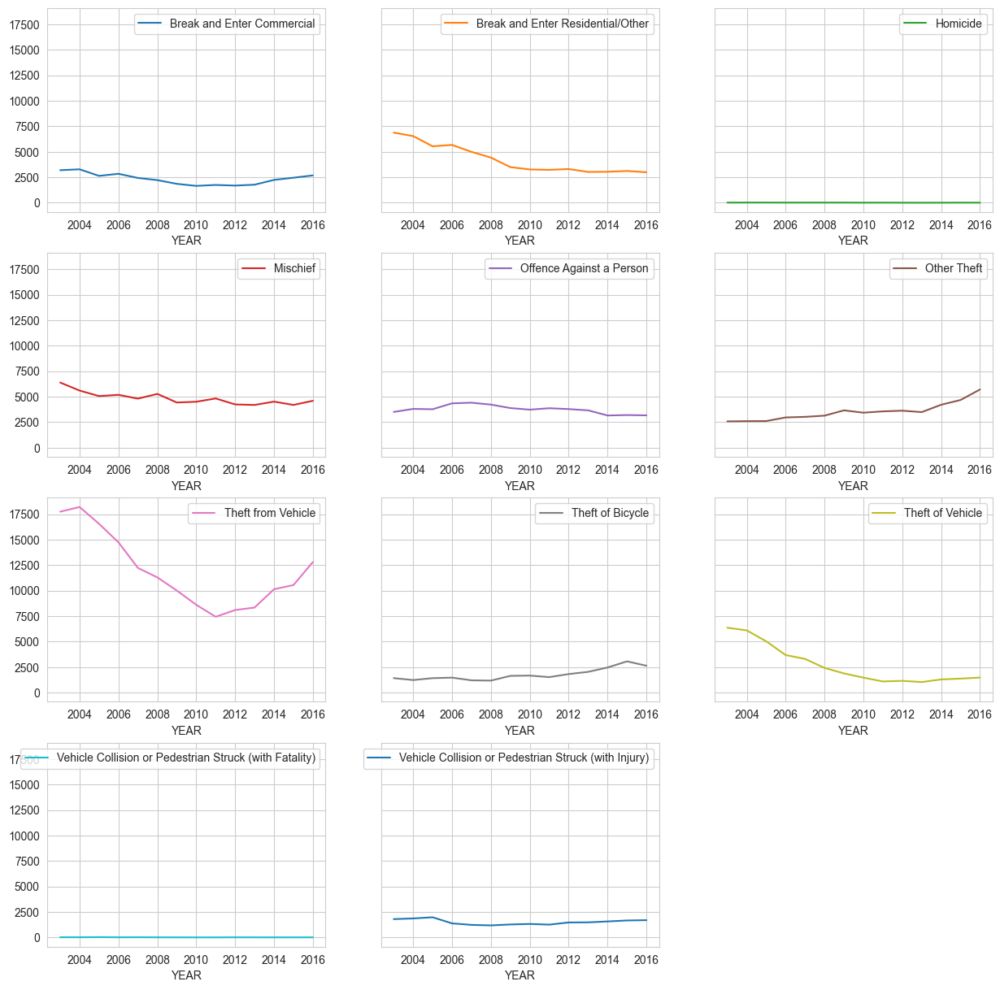

In [27]:
# Crime count by Category per year
dfPivCrimeDate = df_crime.pivot_table(values='Incident'
                                     ,aggfunc=np.size
                                     ,columns='TYPE'
                                     ,index='YEAR'
                                     ,fill_value=0)
plo = dfPivCrimeDate.plot(figsize=(15, 15), subplots=True, layout=(-1, 3), sharex=False, sharey=True)

In [11]:
# New DataFrame to filter out columns needed
df_RandomF = df_crime

# Split data for training and testing
#df_RandomF['train'] = np.random.uniform(0, 1, len(df_RandomF)) <= .70

X = df_RandomF[['YEAR', 'MONTH', 'DAY','HOUR', 'NeighbourhoodID']]

Y = df_RandomF[['TYPE']]

# To create a training and testing set, I am splitting the data
# by 70% training and 30% testing
X_train , X_test, y_train, y_test = train_test_split( X, Y, test_size = 0.3, random_state = 5)

### 使用Decision Tree Classifier 来预测犯罪，使用Gini和Entropy两种方法

1. 这两个的准确率差不多，都是43%左右

In [12]:
clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 5,
                               max_depth=5, min_samples_leaf=8)
clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=8, random_state=5)

In [13]:
# 添加预测Test set
y_pred_gn = clf_gini.predict(X_test)

In [14]:
clf_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 5,
                                    max_depth=5, min_samples_leaf=8)
clf_entropy.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=8,
                       random_state=5)

In [15]:
# Adding prediction test
y_pred_en = clf_entropy.predict(X_test)

In [16]:
# Random values for prediction 
clf_gini.predict([[2017,1,5,15.0,12]])

c:\Users\Xuqiao Jiang\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


array(['Theft from Vehicle'], dtype=object)

In [17]:
# 使用相同的参数进行预测
df_pred[(df_pred['YEAR'] == 2017) & 
        (df_pred['MONTH'] == 1) & 
        (df_pred['DAY'] == 5) & 
        (df_pred['HOUR'] == 15.0) &
        (df_pred['NeighbourhoodID'] == 12)]

,TYPE,YEAR,MONTH,DAY,HOUR,HUNDRED_BLOCK,NEIGHBOURHOOD,X,Y,Latitude,Longitude,NeighbourhoodID,CrimeTypeID,Incident,Date,DayOfWeek,DayOfWeekID


In [18]:
df_pred[(df_pred['YEAR'] == 2017) & 
        (df_pred['MONTH'] == 1) & 
        (df_pred['DAY'] == 5) & 
        (df_pred['NeighbourhoodID'] == 12)]

,TYPE,YEAR,MONTH,DAY,HOUR,HUNDRED_BLOCK,NEIGHBOURHOOD,X,Y,Latitude,Longitude,NeighbourhoodID,CrimeTypeID,Incident,Date,DayOfWeek,DayOfWeekID
514801,Break and Enter Residential/Other,2017,1,5,9.0,4XX E 6TH AVE,Mount Pleasant,493142.36,5456944.35,49.265223,-123.094259,12,2,1,2017-01-05,Thursday,3
514947,Theft from Vehicle,2017,1,5,21.0,1XX W 1ST AVE,Mount Pleasant,492084.79,5457519.47,49.270384,-123.108807,12,7,1,2017-01-05,Thursday,3
526353,Break and Enter Commercial,2017,1,5,5.0,2X W 7TH AVE,Mount Pleasant,492335.09,5456880.64,49.264641,-123.105354,12,1,1,2017-01-05,Thursday,3
527070,Theft from Vehicle,2017,1,5,22.0,2XX E 6TH AVE,Mount Pleasant,492791.96,5456976.73,49.265511,-123.099076,12,7,1,2017-01-05,Thursday,3
530182,Other Theft,2017,1,5,14.0,23XX CAMBIE ST,Mount Pleasant,491656.42,5456901.55,49.264820,-123.114682,12,6,1,2017-01-05,Thursday,3


In [19]:
print ('Accuracy is', accuracy_score(y_test,y_pred_gn)*100, '%')

Accuracy is 43.16330709377986 %


In [20]:
print ('Accuracy is', accuracy_score(y_test,y_pred_en)*100, '%')

Accuracy is 43.214009451439495 %



Seasonal Distribution Analysis:
Spring: 127,368 incidents (24.84%)
Summer: 134,196 incidents (26.17%)
Fall: 130,262 incidents (25.40%)
Winter: 120,969 incidents (23.59%)


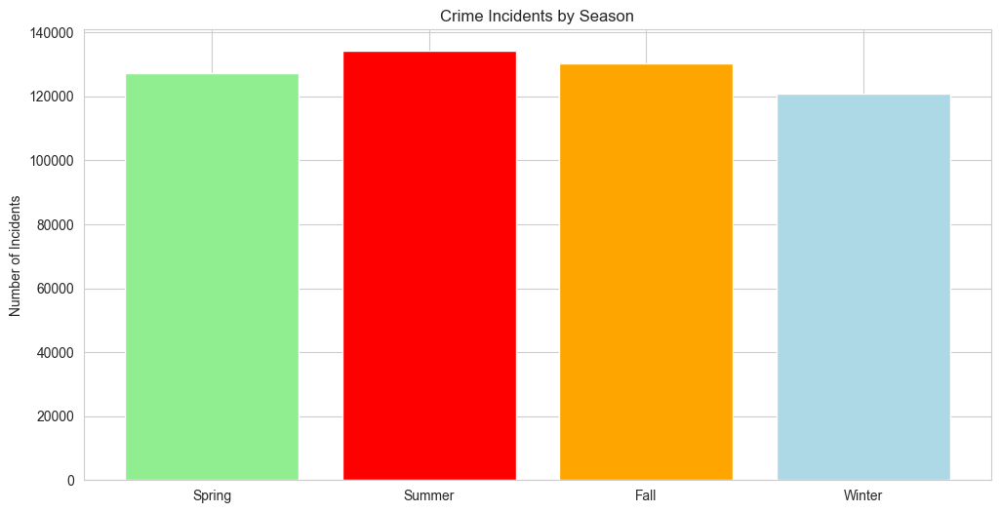

In [21]:
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'


df_rf['Season'] = df_rf['MONTH'].apply(get_season)

plt.figure(figsize=(12, 6))
seasonal_data = df_rf['Season'].value_counts()
seasonal_order = ['Spring', 'Summer', 'Fall', 'Winter']
seasonal_data = seasonal_data.reindex(seasonal_order)

plt.bar(seasonal_data.index, 
        seasonal_data.values, 
        color=['lightgreen', 'red', 'orange', 'lightblue'])
plt.title('Crime Incidents by Season')
plt.ylabel('Number of Incidents')

print("\nSeasonal Distribution Analysis:")
for season in seasonal_order:
    count = seasonal_data[season]
    percentage = (count / seasonal_data.sum()) * 100
    print(f"{season}: {count:,} incidents ({percentage:.2f}%)")

plt.show()

In [22]:
crime_category = {
    'Theft from Vehicle': 'Theft',
    'Other Theft': 'Theft',
    'Mischief': 'Mischief',
    'Offence Against a Person': 'Against',
    'Break and Enter Residential/Other': 'Break and Enter',
    'Break and Enter Commercial': 'Break and Enter',
    'Theft of Vehicle': 'Theft',
    'Theft of Bicycle': 'Theft',
    'Vehicle Collision or Pedestrian Struck (with Injury)': 'Vehicle Collision',
    'Vehicle Collision or Pedestrian Struck (with Fatality)': 'Vehicle Collision',
    'Homicide': 'Homicide'
}

df_crime['category'] = df_crime['TYPE'].map(crime_category)

In [23]:
def time_type(hour):
    if 6 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 18:
        return 'Afternoon'
    elif 18 <= hour < 24:
        return 'Evening'
    else:
        return 'Night'

def day_type(day):
    if day in ['Saturday', 'Sunday']:
        return 'Weekend'
    else:
        return 'Weekday'

    
df_crime['time_type'] = df_crime['HOUR'].apply(time_type)
df_crime['DayType'] = df_crime['DayOfWeek'].apply(day_type)

category_counts = df_crime['category'].value_counts().reset_index()
category_counts.columns = ['Category', 'Count']

print(category_counts)

            Category   Count
0              Theft  278446
1    Break and Enter   92292
2           Mischief   67832
3            Against   52537
4  Vehicle Collision   21479
5           Homicide     209


In [24]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

df_model = df_crime.copy()
df_model.drop(columns=['X', 'Y', 'Latitude', 'Longitude', 'HUNDRED_BLOCK','TYPE','YEAR','DayOfWeek', 'DAY', 'Date', 'NeighbourhoodID', 'CrimeTypeID', 'Incident' ], inplace=True)

features = ['NEIGHBOURHOOD', 'time_type', 'DayType', 'DayOfWeekID']

data_encoded = pd.get_dummies(df_model, columns=features)

label_encoder = LabelEncoder()
data_encoded['category_encoded'] = label_encoder.fit_transform(df_model['category'])

X = data_encoded.drop(columns=['category', 'category_encoded'])
y = data_encoded['category_encoded']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

model = LogisticRegression(max_iter=10000, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_,
                          zero_division=1))

Accuracy: 0.6415234157899355

Classification Report:
                   precision    recall  f1-score   support

          Against       0.99      1.00      1.00     10573
  Break and Enter       0.36      0.05      0.09     18536
         Homicide       1.00      0.00      0.00        34
         Mischief       0.12      0.00      0.00     13599
            Theft       0.61      0.98      0.75     55459
Vehicle Collision       1.00      0.00      0.00      4358

         accuracy                           0.64    102559
        macro avg       0.68      0.34      0.31    102559
     weighted avg       0.56      0.64      0.53    102559



[[10573     0     0     0     0     0]
 [    0   984     0    14 17538     0]
 [   34     0     0     0     0     0]
 [    5   480     0     3 13111     0]
 [   62  1156     0     7 54234     0]
 [    0   114     0     0  4244     0]]
['Theft' 'Break and Enter' 'Mischief' 'Against' 'Vehicle Collision'
 'Homicide']
['Theft' 'Break and Enter' 'Mischief' 'Against' 'Vehicle Collision'
 'Homicide']


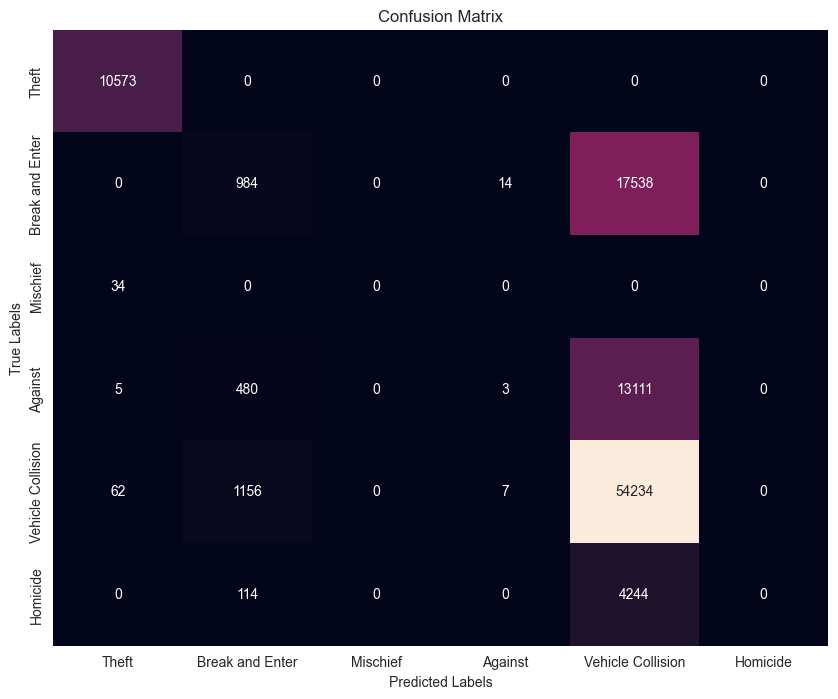

In [25]:
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)
labels = data_encoded['category'].unique()
print(labels)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cbar=False)
labels = data_encoded['category'].unique()
print(labels)
# Add labels, title, and axis ticks
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.xticks(ticks=np.arange(len(labels)) + 0.5, labels= labels)
plt.yticks(ticks=np.arange(len(labels)) + 0.5, labels= labels)

plt.show()